In [191]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.corpus import stopwords
import re
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import AdaBoostClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer, TfidfVectorizer

import tweepy 
from tweepy.streaming import StreamListener
from tweepy import OAuthHandler
from tweepy import Stream
import re 


from wordcloud import WordCloud, STOPWORDS

In [112]:
access_token = "1222059950731481089-NzkTtc9NizJyclgIO6yIZ6IDhugGpG"
access_token_secret = "yYWLCURV2LVhEhxyeCXJgUq0XgTdeTzob4XPen4C9POL7"
consumer_key = "rsnKLIsTMFIR3TkK4SE8ni0gl"
consumer_secret = "llGdjlRZo0myeuo8iE8ckhcCaDa3GnF9QM9rxo4yeO4f6S5iMd"

In [113]:

# Creating the authentication object
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
# Setting your access token and secret
auth.set_access_token(access_token, access_token_secret)
# Creating the API object while passing in auth information
api = tweepy.API(auth)

In [7]:
import tweepy
import pandas as pd

In [54]:
flpkrt=[]  
screen_name='undp'
new_tweets = api.user_timeline(screen_name = screen_name,count=200)
flpkrt.extend(new_tweets)
oldest = flpkrt[-1].id - 1
while len(new_tweets) > 0:    
    new_tweets = api.user_timeline(screen_name = screen_name,count=200,max_id=oldest)
    flpkrt.extend(new_tweets)
    oldest = flpkrt[-1].id - 1
    print ("...%s tweets downloaded so far" % (len(flpkrt)))

...400 tweets downloaded so far
...600 tweets downloaded so far
...800 tweets downloaded so far
...1000 tweets downloaded so far
...1200 tweets downloaded so far
...1400 tweets downloaded so far
...1600 tweets downloaded so far
...1800 tweets downloaded so far
...2000 tweets downloaded so far
...2200 tweets downloaded so far
...2400 tweets downloaded so far
...2600 tweets downloaded so far
...2800 tweets downloaded so far
...3000 tweets downloaded so far
...3200 tweets downloaded so far
...3247 tweets downloaded so far
...3247 tweets downloaded so far


In [70]:
outtweets_snap = [[tweet.id_str, tweet.created_at,tweet.lang, tweet.text] for tweet in flpkrt]

In [71]:
df_snap = pd.DataFrame(outtweets_snap) 
df_snap.to_csv('undp_twitter_clean.csv',index=False, header=True)

In [72]:
tflpkrt = pd.read_csv('undp_twitter_clean.csv')

In [73]:
tflpkrt

,0,1,2,3
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b..."
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...
...,...,...,...,...
3242,1179184475953078272,2019-10-02 00:01:01,en,Alade was fed up with discarded takeaway conta...
3243,1179158575773601797,2019-10-01 22:18:06,en,"This International #Dayofnonviolence, see how ..."
3244,1179139185694912512,2019-10-01 21:01:03,en,Jamaica is seeing more frequent &amp; severe d...
3245,1179126368564662273,2019-10-01 20:10:08,en,Know of a CEO who has taken the #SDGs into the...


In [74]:
#Tweets saved in CSV and preforming Preprocessing

s=pd.read_csv('undp_twitter_clean.csv') 
s['PreProcess_Sentence'] = s['3'].str.replace("[RT @]", " ")


In [75]:
s

,0,1,2,3,PreProcess_Sentence
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...,#COVID19 has pushed the world into an unpreced...
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...,egister now for our #HekimaSeries at 10AM ES ...
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b...","ASteiner: ""Usually, managers think about b..."
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...,Disinformation is spreading faster than #COVID...
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...,#COVID19 is dismantling 30 years of hard-won a...
...,...,...,...,...,...
3242,1179184475953078272,2019-10-02 00:01:01,en,Alade was fed up with discarded takeaway conta...,Alade was fed up with discarded takeaway conta...
3243,1179158575773601797,2019-10-01 22:18:06,en,"This International #Dayofnonviolence, see how ...","his International #Dayofnonviolence, see how ..."
3244,1179139185694912512,2019-10-01 21:01:03,en,Jamaica is seeing more frequent &amp; severe d...,Jamaica is seeing more frequent &amp; severe d...
3245,1179126368564662273,2019-10-01 20:10:08,en,Know of a CEO who has taken the #SDGs into the...,Know of a CEO who has taken the #SDGs into the...


In [76]:
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: x.lower())

s.head()

,0,1,2,3,PreProcess_Sentence
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...,#covid19 has pushed the world into an unpreced...
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...,egister now for our #hekimaseries at 10am es ...
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b...","asteiner: ""usually, managers think about b..."
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...,disinformation is spreading faster than #covid...
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...,#covid19 is dismantling 30 years of hard-won a...


In [77]:
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: re.sub(r'\d+', ' ', x))

In [78]:
s

,0,1,2,3,PreProcess_Sentence
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...,#covid has pushed the world into an unprecede...
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...,egister now for our #hekimaseries at am es ...
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b...","asteiner: ""usually, managers think about b..."
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...,disinformation is spreading faster than #covid...
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...,#covid is dismantling years of hard-won ach...
...,...,...,...,...,...
3242,1179184475953078272,2019-10-02 00:01:01,en,Alade was fed up with discarded takeaway conta...,alade was fed up with discarded takeaway conta...
3243,1179158575773601797,2019-10-01 22:18:06,en,"This International #Dayofnonviolence, see how ...","his international #dayofnonviolence, see how ..."
3244,1179139185694912512,2019-10-01 21:01:03,en,Jamaica is seeing more frequent &amp; severe d...,jamaica is seeing more frequent &amp; severe d...
3245,1179126368564662273,2019-10-01 20:10:08,en,Know of a CEO who has taken the #SDGs into the...,know of a ceo who has taken the #sdgs into the...


In [162]:
#Removing Urls ,Punctuation,Stopwords,Numericals,tokenizing 
TEXT_CLEANING_RE = "https?:\S+|http?:\S|[^A-Za-z0-9]+"
s['PreProcess_Sentence']  = s['PreProcess_Sentence'].map(lambda x: re.sub(TEXT_CLEANING_RE, ' ', x))
s['PreProcess_Sentence']   = s['PreProcess_Sentence'] .map(lambda x: x.translate(x.maketrans('', '', string.punctuation)))
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: x.strip())
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: word_tokenize(x))
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: [word for word in x if word.isalpha()])
stop_words = set(stopwords.words('english'))
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: [w for w in x if not w in stop_words])

TypeError: expected string or bytes-like object

In [80]:
s

,0,1,2,3,PreProcess_Sentence
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...,"[covid, pushed, world, unprecedented, economic..."
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...,"[egister, hekimaseries, es, hrs, iconic, wole,..."
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b...","[asteiner, usually, managers, think, building,..."
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...,"[disinformation, spreading, faster, covid, dea..."
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...,"[covid, dismantling, years, hard, achievements..."
...,...,...,...,...,...
3242,1179184475953078272,2019-10-02 00:01:01,en,Alade was fed up with discarded takeaway conta...,"[alade, fed, discarded, takeaway, containers, ..."
3243,1179158575773601797,2019-10-01 22:18:06,en,"This International #Dayofnonviolence, see how ...","[international, dayofnonviolence, see, support..."
3244,1179139185694912512,2019-10-01 21:01:03,en,Jamaica is seeing more frequent &amp; severe d...,"[jamaica, seeing, frequent, amp, severe, droug..."
3245,1179126368564662273,2019-10-01 20:10:08,en,Know of a CEO who has taken the #SDGs into the...,"[know, ceo, taken, sdgs, company, dna, supply,..."


In [83]:
s.head()
lem = WordNetLemmatizer()
['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: [lem.lemmatize(word,"v") for word in x])

# Turn lists back to string
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: ' '.join(x))

In [82]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\91976\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\wordnet.zip.


True

In [44]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer, TfidfVectorizer

import tweepy 
from tweepy.streaming import StreamListener
from tweepy import OAuthHandler
from tweepy import Stream
import re 
import wordcloud, stopwords

SyntaxError: Missing parentheses in call to 'print'. Did you mean print(lang)? (__init__.py, line 84)

In [42]:
pip install stopwords

  Created wheel for stopwords: filename=stopwords-0.1.3-py2.py3-none-any.whl size=37292 sha256=04681ecfd574c3713c2b07cd67cb52c79fa2562ec8eb5cb46d446200df44373f
  Stored in directory: c:\users\91976\appdata\local\pip\cache\wheels\d7\4c\45\ca0b0cc6e2596fad1a411a3b8f7c119c149bc9e508788db715
Successfully built stopwords
Note: you may need to restart the kernel to use updated packages.


In [52]:
s['PreProcess_Sentence'] = s['2'].str.replace("[RT @]", " ")

KeyError: '2'

In [84]:
s['PreProcess_Sentence'] = s['PreProcess_Sentence'].map(lambda x: x.strip())

In [86]:
s.head()

,0,1,2,3,PreProcess_Sentence
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...,covid push world unprecedented economic crisis...
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...,egister hekimaseries es hrs iconic wole soyink...
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b...",asteiner usually managers think build ecosyste...
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...,disinformation spread faster covid deadly cons...
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...,covid dismantle years hard achievements povert...


In [87]:
s.to_csv('Twitter_undp.csv')

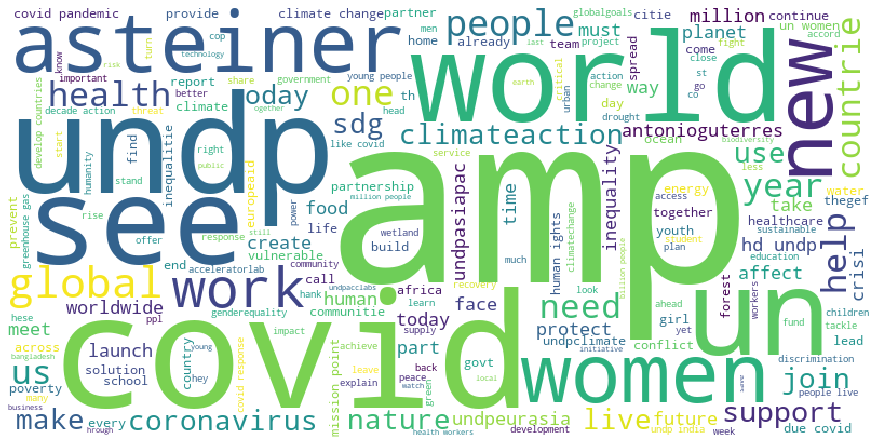

In [98]:
comment_words = ' '
stopwords = set(STOPWORDS)
df = s['PreProcess_Sentence']
for val in pd.DataFrame(df).PreProcess_Sentence:
    val = str(val) 
    tokens = val.split()           
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
    for words in tokens:
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 400, background_color ='white', stopwords = stopwords, min_font_size = 7).generate(comment_words)
plt.figure(figsize = (20, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)   
plt.show() 

In [91]:
from wordcloud import WordCloud, STOPWORDS

In [97]:
blob = TextBlob(str(s['PreProcess_Sentence']))
blob.correct()

TextBlob("0       could push world unprecedented economic crisis...
1       register hekimaseries es his ironic whole saying...
2       sterner usually managers think build ecosyste...
3       disinformation spread faster could deadly sons...
4       could dismantled years hard achievements poverty...
                              ...                        
3242    blade feed discard takeaway container siberia...
3243    international dayofnonviolence see support per...
3244    jamaica see frequent amp severe draughts day o...
3245    know co take sides company da supply chain am...
3246    cadet martin test first wave andros users wh...
Same: PreProcess_Sentence, Length: 3247, type: object")

In [95]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.


In [175]:
from textblob import TextBlob

In [99]:
#Sentiment Analysis

s['Sentiment'] = s['PreProcess_Sentence'].apply(lambda tweet: TextBlob(tweet).sentiment)


In [100]:
s['Polarity']= s['PreProcess_Sentence'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)

In [101]:
s['subjectivity']= s['PreProcess_Sentence'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

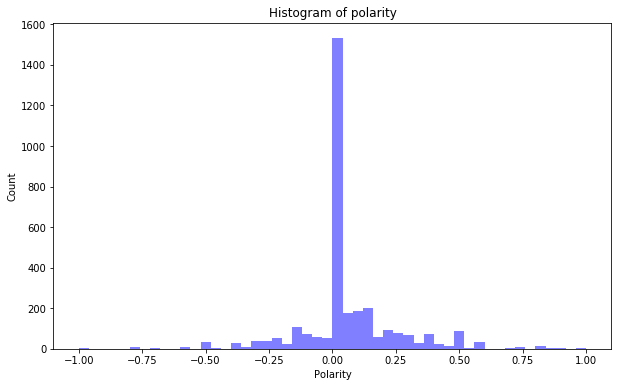

In [102]:
num_bins = 50
plt.figure(figsize=(10,6))
n, bins, patches = plt.hist(s.Polarity, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Polarity')
plt.ylabel('Count')
plt.title('Histogram of polarity')
plt.show();

In [103]:
s.head()

,0,1,2,3,PreProcess_Sentence,Sentiment,Polarity,subjectivity
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...,covid push world unprecedented economic crisis...,"(0.4, 0.55)",0.400000,0.550000
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...,egister hekimaseries es hrs iconic wole soyink...,"(0.5, 0.5)",0.500000,0.500000
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b...",asteiner usually managers think build ecosyste...,"(-0.024999999999999994, 0.225)",-0.025000,0.225000
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...,disinformation spread faster covid deadly cons...,"(-0.2, 0.4)",-0.200000,0.400000
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...,covid dismantle years hard achievements povert...,"(-0.2916666666666667, 0.5416666666666666)",-0.291667,0.541667


In [104]:
s.Sentiment[s['Polarity']>0] = 'positive'
s.Sentiment[s['Polarity']< 0] = 'negative'
s.Sentiment[s['Polarity']==0] ='neutral'

In [105]:
s.head()

,0,1,2,3,PreProcess_Sentence,Sentiment,Polarity,subjectivity
0,1270717355287592960,2020-06-10 14:00:00,en,#COVID19 has pushed the world into an unpreced...,covid push world unprecedented economic crisis...,positive,0.400000,0.550000
1,1270687155191312384,2020-06-10 12:00:00,en,Register now for our #HekimaSeries at 10AM EST...,egister hekimaseries es hrs iconic wole soyink...,positive,0.500000,0.500000
2,1270684358001770496,2020-06-10 11:48:53,en,"RT @ASteiner: ""Usually, managers think about b...",asteiner usually managers think build ecosyste...,negative,-0.025000,0.225000
3,1270672054468194310,2020-06-10 11:00:00,en,Disinformation is spreading faster than #COVID...,disinformation spread faster covid deadly cons...,negative,-0.200000,0.400000
4,1270611658487009280,2020-06-10 07:00:00,en,#COVID19 is dismantling 30 years of hard-won a...,covid dismantle years hard achievements povert...,negative,-0.291667,0.541667


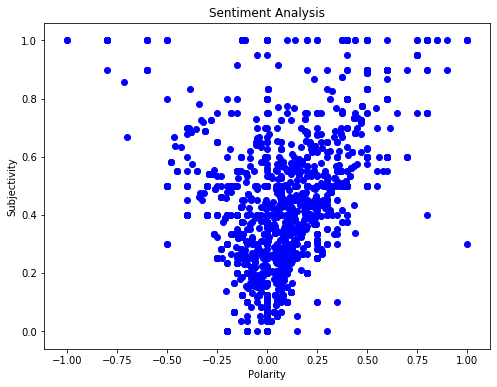

In [107]:
import matplotlib.pyplot as plt
plt.figure(figsize=(8,6))
for i in range(0, s.shape[0]):
 plt.scatter(s["Polarity"][i], s["subjectivity"][i], color='Blue')
 
plt.title('Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Subjectivity')
plt.show()

In [108]:
s.to_csv('Twitter_undp_sentimental&Polarity.csv')

In [163]:
uni=[]  
screen_name='unicef'
new_tweets = api.user_timeline(screen_name = screen_name,count=200)
uni.extend(new_tweets)
oldest = uni[-1].id - 1
while len(new_tweets) > 0:    
    new_tweets = api.user_timeline(screen_name = screen_name,count=200,max_id=oldest)
    uni.extend(new_tweets)
    oldest = uni[-1].id - 1
    print ("...%s tweets downloaded so far" % (len(uni)))

...400 tweets downloaded so far
...599 tweets downloaded so far
...799 tweets downloaded so far
...999 tweets downloaded so far
...1199 tweets downloaded so far
...1399 tweets downloaded so far
...1599 tweets downloaded so far
...1799 tweets downloaded so far
...1999 tweets downloaded so far
...2199 tweets downloaded so far
...2399 tweets downloaded so far
...2599 tweets downloaded so far
...2799 tweets downloaded so far
...2999 tweets downloaded so far
...3199 tweets downloaded so far
...3200 tweets downloaded so far
...3200 tweets downloaded so far


In [164]:
outtweets_uni = [[tweet.id_str, tweet.created_at,tweet.lang, tweet.text] for tweet in uni]

In [165]:
df_uni= pd.DataFrame(outtweets_uni) 
df_uni.to_csv('unicef.csv',index=False, header=True)

In [166]:
df_uni.head()

,0,1,2,3
0,1271064640664080384,2020-06-11 13:00:00,en,What your child sees you do is as important as...
1,1270931272173527043,2020-06-11 04:10:02,en,"In Juárez, the posters of missing girls that c..."
2,1270870879665295360,2020-06-11 00:10:04,en,Harouna and Mady spend some quality time with ...
3,1270821007117422592,2020-06-10 20:51:53,en,"RT @unicefchief: Around the world, children's ..."
4,1270750111187054592,2020-06-10 16:10:10,en,Determination.\n\n17-year-old Ariadna from Ven...


In [194]:
t=pd.read_csv('unicef.csv') 
t['PreProcess_Sentence'] = t['3'].str.replace("[RT @]", " ")

In [195]:
t.head()

,0,1,2,3,PreProcess_Sentence
0,1271064640664080384,2020-06-11 13:00:00,en,What your child sees you do is as important as...,What your child sees you do is as important as...
1,1270931272173527043,2020-06-11 04:10:02,en,"In Juárez, the posters of missing girls that c...","In Juárez, the posters of missing girls that c..."
2,1270870879665295360,2020-06-11 00:10:04,en,Harouna and Mady spend some quality time with ...,Harouna and Mady spend some quality time with ...
3,1270821007117422592,2020-06-10 20:51:53,en,"RT @unicefchief: Around the world, children's ...","unicefchief: Around the world, children's ..."
4,1270750111187054592,2020-06-10 16:10:10,en,Determination.\n\n17-year-old Ariadna from Ven...,Determination.\n\n17-year-old Ariadna from Ven...


In [183]:
#Removing Urls ,Punctuation,Stopwords,Numericals,tokenizing 
TEXT_CLEANING_RE = "https?:\S+|http?:\S|[^A-Za-z0-9]+"
t['PreProcess_Sentence']  = t['PreProcess_Sentence'].map(lambda x: re.sub(TEXT_CLEANING_RE, ' ', x))
t['PreProcess_Sentence']   = t['PreProcess_Sentence'] .map(lambda x: x.translate(x.maketrans('', '', string.punctuation)))
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.strip())
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: word_tokenize(x))
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [word for word in x if word.isalpha()])
stop_words = set(stopwords.words('english'))
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [w for w in x if not w in stop_words])

AttributeError: 'set' object has no attribute 'words'

In [147]:


# Turn lists back to string
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: ' '.join(x))

In [182]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.lower())

In [142]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.lower())

In [172]:
t.head()

,0,1,2,3,PreProcess_Sentence
0,1271064640664080384,2020-06-11 13:00:00,en,What your child sees you do is as important as...,"[child, sees, important, hear, say, ake, every..."
1,1270931272173527043,2020-06-11 04:10:02,en,"In Juárez, the posters of missing girls that c...","[ju, rez, posters, missing, girls, cover, wall..."
2,1270870879665295360,2020-06-11 00:10:04,en,Harouna and Mady spend some quality time with ...,"[harouna, mady, spend, quality, time, parents,..."
3,1270821007117422592,2020-06-10 20:51:53,en,"RT @unicefchief: Around the world, children's ...","[unicefchief, around, world, children, lives, ..."
4,1270750111187054592,2020-06-10 16:10:10,en,Determination.\n\n17-year-old Ariadna from Ven...,"[determination, year, old, ariadna, venezuela,..."


In [170]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: re.sub(r'\d+', ' ', x))

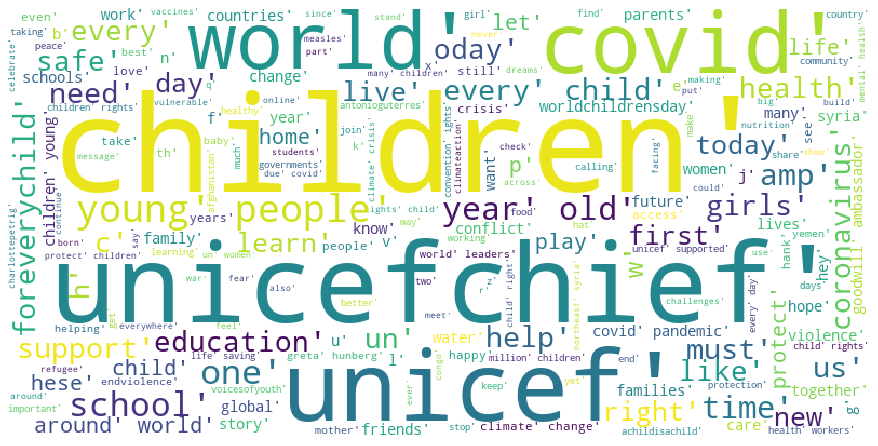

In [173]:
comment_words = ' '
stopwords = set(STOPWORDS)
df = t['PreProcess_Sentence']
for val in pd.DataFrame(df).PreProcess_Sentence:
    val = str(val) 
    tokens = val.split()           
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
    for words in tokens:
        comment_words = comment_words + words + ' '
wordcloud = WordCloud(width = 800, height = 400, background_color ='white', stopwords = stopwords, min_font_size = 7).generate(comment_words)
plt.figure(figsize = (20, 6), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0)   
plt.show() 

In [151]:
uni

[Status(_api=<tweepy.api.API object at 0x0000019EADBD09C8>, _json={'created_at': 'Thu Jun 11 04:10:02 +0000 2020', 'id': 1270931272173527043, 'id_str': '1270931272173527043', 'text': 'In Juárez, the posters of missing girls that cover walls and windows are a reminder of the everyday dangers women a… https://t.co/7nU9zgIOSE', 'truncated': True, 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/7nU9zgIOSE', 'expanded_url': 'https://twitter.com/i/web/status/1270931272173527043', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}]}, 'source': '<a href="https://www.hootsuite.com" rel="nofollow">Hootsuite Inc.</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 33933259, 'id_str': '33933259', 'name': 'UNICEF', 'screen_name': 'UNICEF', 'location': '', 'description': 'The COVID-19 crisis is a child righ

In [178]:
t['Sentiment'] = t['PreProcess_Sentence'].apply(lambda tweet: TextBlob(tweet).sentiment)


TypeError: The `text` argument passed to `__init__(text)` must be a string, not <class 'list'>

In [177]:
blob = TextBlob(str(t['PreProcess_Sentence']))
blob.correct()

TextBlob("0       [child, sees, important, hear, say, are, every...
1       [j, red, posters, missing, girls, cover, wall...
2       [around, may, spend, quality, time, parents,...
3       [unicefchief, around, world, children, lives, ...
4       [determination, year, old, arizona, venezuela,...
                              ...                        
3195    [generation, children, today, facing, new, ha...
3196    [next, years, hold, children, rights, unicefch...
3197    [unicefchief, children, today, facing, set, ch...
3198    [unicefchief, childhood, changed, need, change...
3199    [uniceflac, children, evacuated, aftermath, he...
Same: PreProcess_Sentence, Length: 3200, type: object")

In [192]:
t['PreProcess_Sentence'] = t['3'].str.replace("[RT @]", " ")
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.lower())



# Remove numbers
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: re.sub(r'\d+', ' ', x))

# Remove links
TEXT_CLEANING_RE = "https?:\S+|http?:\S|[^A-Za-z0-9]+"
t['PreProcess_Sentence']  = t['PreProcess_Sentence'].map(lambda x: re.sub(TEXT_CLEANING_RE, ' ', x))

# Remove Punctuation
t['PreProcess_Sentence']   = t['PreProcess_Sentence'] .map(lambda x: x.translate(x.maketrans('', '', string.punctuation)))
# Remove white spaces
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.strip())

# Tokenize into words
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: word_tokenize(x))

t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [word for word in x if word.isalpha()])

lem = WordNetLemmatizer()
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [lem.lemmatize(word,"v") for word in x])

# Turn lists back to string
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: ' '.join(x))
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.strip())

stop_words = set(stopwords.words('english'))
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [w for w in x if not w in stop_words])

In [189]:
pip install stopwords

Note: you may need to restart the kernel to use updated packages.


In [196]:
t.head()

,0,1,2,3,PreProcess_Sentence
0,1271064640664080384,2020-06-11 13:00:00,en,What your child sees you do is as important as...,What your child sees you do is as important as...
1,1270931272173527043,2020-06-11 04:10:02,en,"In Juárez, the posters of missing girls that c...","In Juárez, the posters of missing girls that c..."
2,1270870879665295360,2020-06-11 00:10:04,en,Harouna and Mady spend some quality time with ...,Harouna and Mady spend some quality time with ...
3,1270821007117422592,2020-06-10 20:51:53,en,"RT @unicefchief: Around the world, children's ...","unicefchief: Around the world, children's ..."
4,1270750111187054592,2020-06-10 16:10:10,en,Determination.\n\n17-year-old Ariadna from Ven...,Determination.\n\n17-year-old Ariadna from Ven...


In [198]:
t['PreProcess_Sentence'] = t['3'].str.replace("[RT @]", " ")

In [199]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.lower())

In [200]:
# Remove numbers
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: re.sub(r'\d+', ' ', x))

In [201]:
TEXT_CLEANING_RE = "https?:\S+|http?:\S|[^A-Za-z0-9]+"
t['PreProcess_Sentence']  = t['PreProcess_Sentence'].map(lambda x: re.sub(TEXT_CLEANING_RE, ' ', x))

In [202]:

t['PreProcess_Sentence']   = t['PreProcess_Sentence'] .map(lambda x: x.translate(x.maketrans('', '', string.punctuation)))

In [203]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.strip())

In [204]:
t.head()

,0,1,2,3,PreProcess_Sentence
0,1271064640664080384,2020-06-11 13:00:00,en,What your child sees you do is as important as...,what your child sees you do is as important as...
1,1270931272173527043,2020-06-11 04:10:02,en,"In Juárez, the posters of missing girls that c...",in ju rez the posters of missing girls that co...
2,1270870879665295360,2020-06-11 00:10:04,en,Harouna and Mady spend some quality time with ...,harouna and mady spend some quality time with ...
3,1270821007117422592,2020-06-10 20:51:53,en,"RT @unicefchief: Around the world, children's ...",unicefchief around the world children s lives ...
4,1270750111187054592,2020-06-10 16:10:10,en,Determination.\n\n17-year-old Ariadna from Ven...,determination year old ariadna from venezuela ...


In [206]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: word_tokenize(x))

In [207]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [word for word in x if word.isalpha()])

In [208]:
stop_words = set(stopwords.words('english'))
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [w for w in x if not w in stop_words])

In [213]:
t.head()

,0,1,2,3,PreProcess_Sentence
0,1271064640664080384,2020-06-11 13:00:00,en,What your child sees you do is as important as...,child see important hear say ake every opportu...
1,1270931272173527043,2020-06-11 04:10:02,en,"In Juárez, the posters of missing girls that c...",ju rez posters miss girls cover wall windows r...
2,1270870879665295360,2020-06-11 00:10:04,en,Harouna and Mady spend some quality time with ...,harouna mady spend quality time parent home ma...
3,1270821007117422592,2020-06-10 20:51:53,en,"RT @unicefchief: Around the world, children's ...",unicefchief around world children live alter c...
4,1270750111187054592,2020-06-10 16:10:10,en,Determination.\n\n17-year-old Ariadna from Ven...,determination year old ariadna venezuela work ...


In [210]:
# Word Lemmatization
lem = WordNetLemmatizer()
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: [lem.lemmatize(word,"v") for word in x])

# Turn lists back to string
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: ' '.join(x))

In [212]:
t['PreProcess_Sentence'] = t['PreProcess_Sentence'].map(lambda x: x.strip())

In [214]:
blob = TextBlob(str(t['PreProcess_Sentence']))
blob.correct()

TextBlob("0       child see important hear say are every opportune...
1       j red posters miss girls cover wall windows r...
2       around may spend quality time parent home ma...
3       unicefchief around world children live alter c...
4       determination year old arizona venezuela work ...
                              ...                        
3195    generation children today face new challenge g...
3196    next years hold children right unicefchief she...
3197    unicefchief children today face set challenge ...
3198    unicefchief childhood change need change apart...
3199    uniceflac children evacuate aftermath hurricane...
Same: PreProcess_Sentence, Length: 3200, type: object")

In [215]:
t['Sentiment'] = t['PreProcess_Sentence'].apply(lambda tweet: TextBlob(tweet).sentiment)

In [216]:
t['Polarity']= t['PreProcess_Sentence'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)

In [217]:
t['subjectivity']= t['PreProcess_Sentence'].apply(lambda tweet: TextBlob(tweet).sentiment.subjectivity)

In [218]:
t.Sentiment[t['Polarity']>0] = 'positive'
t.Sentiment[t['Polarity']< 0] = 'negative'
t.Sentiment[t['Polarity']==0] ='neutral'

In [219]:
t.head()

,0,1,2,3,PreProcess_Sentence,Sentiment,Polarity,subjectivity
0,1271064640664080384,2020-06-11 13:00:00,en,What your child sees you do is as important as...,child see important hear say ake every opportu...,positive,0.400000,1.0
1,1270931272173527043,2020-06-11 04:10:02,en,"In Juárez, the posters of missing girls that c...",ju rez posters miss girls cover wall windows r...,negative,-0.200000,0.6
2,1270870879665295360,2020-06-11 00:10:04,en,Harouna and Mady spend some quality time with ...,harouna mady spend quality time parent home ma...,positive,0.500000,0.5
3,1270821007117422592,2020-06-10 20:51:53,en,"RT @unicefchief: Around the world, children's ...",unicefchief around world children live alter c...,positive,0.136364,0.5
4,1270750111187054592,2020-06-10 16:10:10,en,Determination.\n\n17-year-old Ariadna from Ven...,determination year old ariadna venezuela work ...,positive,0.100000,0.2


In [221]:
t.to_csv('unicefdata_TanviThanekar.csv')